# Wilcox - Differential expression analysis (DEA)

In [1]:
options(warn=-1)

In [2]:
library_load <- suppressMessages(
    
    list(
        
        # Seurat 
        library(Seurat), 
        
        # DEA
        library(presto), 
    
        # GSEA 
        library(msigdbr), 
        library(fgsea), 
        
        # Data 
        library(tidyverse), 
        library(openxlsx), 
        
        # Plotting 
        library(ComplexHeatmap), 
        library(circlize), 
        library(viridis), 
        library(ggplotify), 
        library(patchwork), 
        
        # Python 
        library(reticulate)
        
    )
)

In [4]:
# Configure reticulate 
use_condaenv(condaenv='p.3.9.19-FD20200109SPLENO', conda="/nobackup/peer/fdeckert/miniconda3/bin/conda", required=NULL)
py_config()

python:         /nobackup/peer/fdeckert/miniconda3/envs/p.3.9.19-FD20200109SPLENO/bin/python
libpython:      /nobackup/peer/fdeckert/miniconda3/envs/p.3.9.19-FD20200109SPLENO/lib/libpython3.9.so
pythonhome:     /nobackup/peer/fdeckert/miniconda3/envs/p.3.9.19-FD20200109SPLENO:/nobackup/peer/fdeckert/miniconda3/envs/p.3.9.19-FD20200109SPLENO
version:        3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21)  [GCC 12.3.0]
numpy:          /nobackup/peer/fdeckert/miniconda3/envs/p.3.9.19-FD20200109SPLENO/lib/python3.9/site-packages/numpy
numpy_version:  1.26.4

NOTE: Python version was forced by use_python() function

In [5]:
options(warn=-1)
options(dplyr.summarise.inform=FALSE)

In [6]:
random_seed <- 42
set.seed(random_seed)

In [7]:
# Set working directory to project root
setwd("/research/peer/fdeckert/FD20200109SPLENO")

In [8]:
# Source files
source("plotting_global.R")

In [9]:
# Plotting Theme
ggplot2::theme_set(theme_global_set(size_select=1)) # From project global source()

# Parameter

In [10]:
cache_test <- FALSE

cnt_min=1
cell_min=3

adj_pval_thr <- 0.05
log2_thr <- 0

# Helper function 

In [11]:
feature_select <- function(so, cnt_min=3, cell_min=3) {
    
    cnt <- GetAssayData(so, assay="RNA", layer="counts")
    cnt <- cnt[rowSums(cnt>=cnt_min)>=cell_min, ]

    so <- CreateSeuratObject(counts=cnt, meta.data=so@meta.data)
    so <- NormalizeData(so, verbose=FALSE)
    
    return(so)
    
}

In [12]:
wilcox <- function(so, ident, assay="RNA", slot="data") {
    
    data <- GetAssayData(so, assay=assay, slot=slot)
    ident <- so[[ident, drop=TRUE]]

    res <- presto::wilcoxauc(data, ident) 
    
    res <- res %>% 
    
        rename(
        
            gene=feature,
            avg_log2FC=logFC,
            p_val=pval,
            p_val_adj=padj,
            pct.1=pct_in,
            pct.2=pct_out
  
        )
    
    res$pct.1 <- res$pct.1/100
    res$pct.2 <- res$pct.2/100
    
    return(res)
}

In [13]:
vp <- function(dea, log2_thr=1, adj_pval_thr=0.05, top_label=10, title=NULL, conserved=FALSE, color_pos=c("pos"="#0000ffff"), color_neg=c("neg"="#fd8008ff")) {
    
    # Set rownames to genes
    if("gene" %in% colnames(dea)) {rownames(dea) <- dea$gene}
    
    # Annotate entries significance by log2_thr and adj_pval_thr
    dea$p_val_adj <- ifelse(dea$p_val_adj == 0, min(dea$p_val_adj), dea$p_val_adj)
    dea$sig <- ifelse((abs(dea$avg_log2FC) >= log2_thr) & (dea$p_val_adj <= adj_pval_thr), "s", "ns")
    
    # Set color based on significance and direction of dea e.g. positive and negative 
    dea$color <- ifelse(dea$sig == "s" & dea$avg_log2FC > 0, names(color_pos), "n.s.")
    dea$color <- ifelse(dea$sig == "s" & dea$avg_log2FC < 0, names(color_neg), dea$color)
    
    color <- c(color_pos, "gray", "black", color_neg)
    names(color) <- c(names(color_pos), "n.s.", "black", names(color_neg))
    
    # Create labels based log2FC and p_val_adj
    dea_pos <- dea[dea$avg_log2FC > 0 & dea$sig == "s", ]
    dea_neg <- dea[dea$avg_log2FC < 0 & dea$sig == "s", ]

    pos_labels_log2FC <- dea_pos[rev(order(dea_pos$avg_log2FC)), ][1:top_label, ] %>% rownames()
    neg_labels_log2FC <- dea_neg[order(dea_neg$avg_log2FC), ][1:top_label, ] %>% rownames()
    
    pos_labels_p_val_adj <- dea_pos[order(dea_pos$p_val_adj), ][1:top_label, ] %>% rownames()
    neg_labels_p_val_adj <- dea_neg[order(dea_neg$p_val_adj), ][1:top_label, ] %>% rownames()
    
    pos_labels <- c(pos_labels_log2FC, pos_labels_p_val_adj)
    neg_labels <- c(neg_labels_log2FC, neg_labels_p_val_adj)
    
    # Set labels 
    dea$label <- ifelse(rownames(dea) %in% c(pos_labels, neg_labels), rownames(dea), NA)

    dea$avg_expression_ratio <- rowMeans(dea[, c("pct.1", "pct.2")])

    # Plot
    volcano_plot <- ggplot(dea, aes(x=avg_expression_ratio, y=avg_log2FC, fill=dea$color, label=label), alpha=1) + 
    
        geom_point(size=4, shape=21, color="white") + 
        geom_hline(aes(yintercept=0), linetype="dotted", colour="black") +
        ggrepel::geom_text_repel(segment.color="black", force=20, force_pull=1, max.overlaps=getOption("ggrepel.max.overlaps", default=100), size=5, alpha=1, guide="none", segment.size=0.1, color='black') + 
        ylim(-max(abs(dea$avg_log2FC)), max(abs(dea$avg_log2FC))) +  
        xlim(0, 1) + 
        ggtitle(title) + xlab("average expression [ratio]") + ylab("average log2FC") + 
        scale_fill_manual(values=color, name="DEA") + 
    
        guides(
            
            color=guide_legend(order=1, title="Group", size=2, keywidth=0.75, keyheight=0.75), 
            alpha="none"
            
        ) + 
    
    theme(
        
        legend.position="right", 
        aspect.ratio=1
        
    )
    
    return(volcano_plot)
    
}

In [14]:
gsea <- function(res_dea, gene_set) {
    
    # Make ranks 
    res_dea$p_val_adj <- ifelse(res_dea$p_val_adj==0, min(res_dea$p_val_adj	[res_dea$p_val_adj>0]), res_dea$p_val_adj)
    res_dea$sign_log_adj_p_values <- -log10(res_dea$p_val_adj) * sign(res_dea$avg_log2FC)
    
    ranks <- res_dea$sign_log_adj_p_values
    names(ranks) <- res_dea$gene
    ranks <- ranks[order(ranks)]
    ranks <- rev(ranks)
    
    # Retain only pathways that overlap with dea lsit
    gene_set_filter <- lapply(gene_set, function(x) {sum(names(ranks) %in% x)>=1})
    gene_set <- gene_set[unlist(gene_set_filter)]

    gsea_res <- fgsea(
        
        pathways=gene_set,
        stats=ranks,
        nperm=100000, 
        minSize=5,
        maxSize=Inf
        
    )
    
    return(gsea_res)
    
}

In [37]:
gsea_pl <- function(gsea, pval_thr=0.1, title=NULL, size_range=5, pathway_suffix=NULL, top=20) {
    
    # Set GSEA data frame 
    gsea <- as.data.frame(gsea)
    gsea <- na.omit(gsea) 
    
    # Set color names 
    color <- color$infection
    
    # Fix pathway names
    if(!is.null(pathway_suffix)) {gsea$pathway <- gsub(pathway_suffix, "", gsea$pathway)}
    gsea$pathway <- gsub("_", " ", gsea$pathway)
    
    # Filter hits 
    gsea_up <- gsea[sign(gsea$NES)==+1, ]
    gsea_down <- gsea[sign(gsea$NES)==-1, ]
    
    gsea_up <- gsea_up[order(gsea_up$pval), ][1:top, ]
    gsea_down <- gsea_down[order(gsea_down$pval), ][1:top, ]
    
    gsea <- rbind(gsea_up, gsea_down)
    gsea <- na.omit(gsea)
    gsea <- distinct(gsea)
    
    # Add color 
    gsea$color <- ifelse(sign(gsea$ES)==-1, names(color)[1], names(color)[2])
    gsea$color <- ifelse(gsea$pval<=pval_thr, gsea$color, NA)

    gsea$sign_log_pval_values <- -log10(gsea$pval) * sign(gsea$ES)
    
    # Short pathway names 
    gsea <- mutate(gsea, pathway = str_sub(pathway, 1, 40))
    
    # Order hits 
    gsea <- gsea[order(gsea$sign_log_pval_values), ]
    gsea$pathway <- factor(gsea$pathway, levels=gsea$pathway)

    x_max <- max(abs(gsea$sign_log_pval_values)) + 0.1
    if(x_max<abs(log10(pval_thr))) {x_max <- abs(log10(pval_thr)) + 0.1}
    
    # Plot 
    plot <- ggplot(gsea, aes(x=sign_log_pval_values, y=pathway, color=color)) + 
        
        geom_vline(xintercept=-log10(pval_thr), linetype="dashed") + 
        geom_vline(xintercept=log10(pval_thr), linetype="dashed") +
    
        geom_point(aes(size=abs(NES))) +

        ggtitle(title) +
        xlab("Signed -log10 adj. p-value") + ylab("") + 
        xlim(-x_max, x_max) + 
        scale_color_manual(values=color, na.value="black", drop=FALSE) +
        scale_size(range=c(0, size_range)) + 
        guides(
            
            color=guide_legend(order=1, title="Group", size=5, keywidth=0.75, keyheight=0.75), 
            size=guide_legend(order=2, title="Abs. (NES)", keywidth=0.75, keyheight=0.75)
            
        ) +
    
        theme(
            
            legend.position="right", 
            legend.justification="top", 
            axis.text.y=element_text(hjust=1, vjust=0.5)
            
        )
    
    return(plot)
    
}

# DEA

In [16]:
# Load Seurat object 
so <- readRDS("data/BSA_0355_SM01_10x_SPLENO/ANALYSIS/pp.rds")

In [17]:
# Order results 
cell_type_order <- levels(so$leiden_cell_type_main)

In [18]:
# Prepare data 
so <- SplitObject(so, split.by="leiden_cell_type_main")

In [19]:
# Order cell types 
so <- so[cell_type_order]

In [20]:
# DEA voom fit 
if(!cache_test) {
    
    res_dea_1 <- lapply(so, function(x) {wilcox(feature_select(x), "infection", assay="RNA", slot="data")})
    saveRDS(res_dea_1, "result/dea/scRNAseq/wilcox/fit.rds")
    
} else {
    
    res_dea_1 <- readRDS("result/dea/scRNAseq/wilcox/fit.rds")
    
}

In [21]:
res_dea_1 <- res_dea_1[cell_type_order]

## Baseline vs CpG

In [22]:
res_dea_1 <- lapply(res_dea_1, function(res) res[res$group=="CpG", ])

In [23]:
openxlsx::write.xlsx(res_dea_1, paste0("result/dea/scRNAseq/wilcox/Baseline_vs_cpg.xlsx"))
saveRDS(res_dea_1, paste0("result/dea/scRNAseq/wilcox/Baseline_vs_cpg.rds"))

## Volcano 

$`1`

$`2`


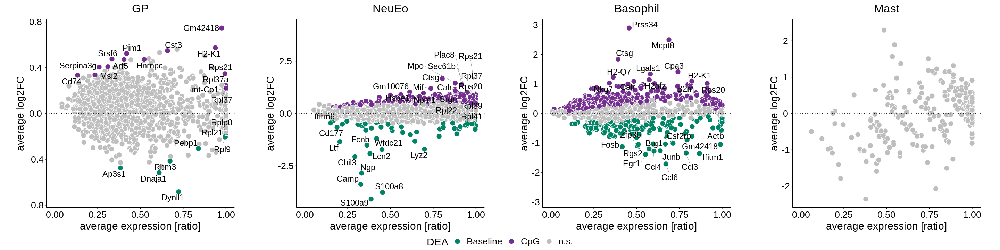


$`3`


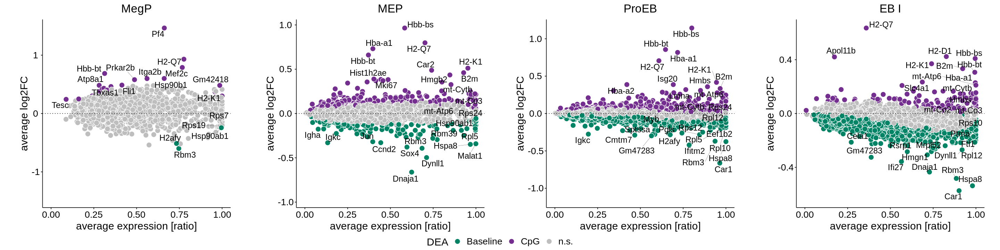


$`4`


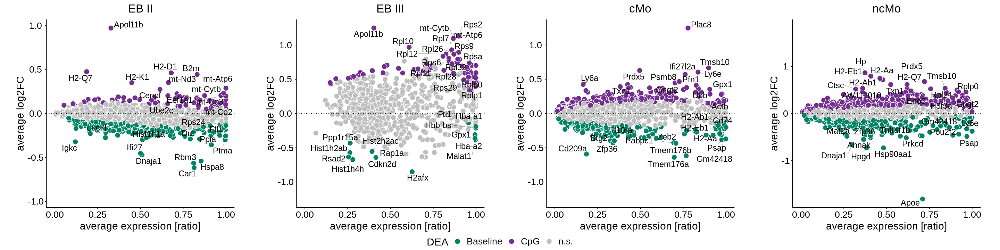


$`5`


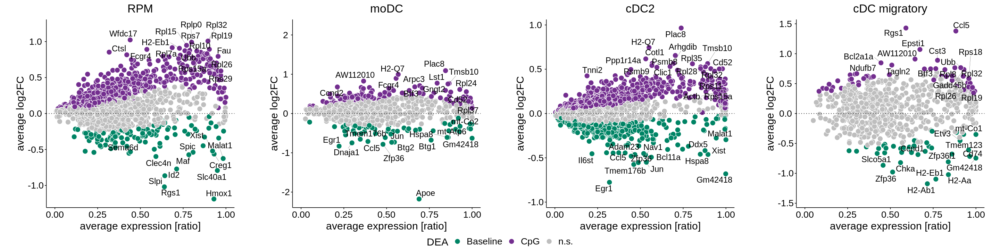


attr(,"class")
[1] "list"      "ggarrange"


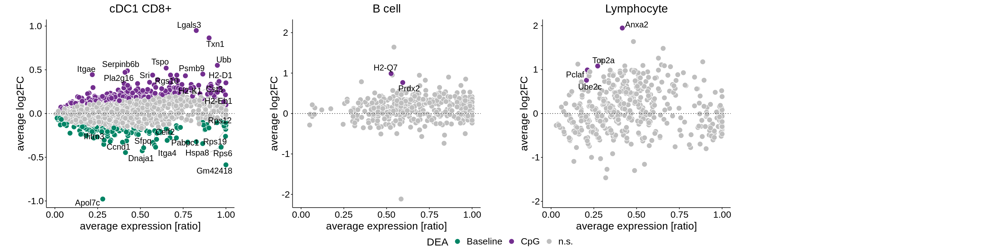

In [24]:
options(repr.plot.width=4*6, repr.plot.height=6)

vp_1 <- lapply(names(res_dea_1), function(i) vp(res_dea_1[[i]], title=i, log2_thr=log2_thr, adj_pval_thr=adj_pval_thr, color_pos=unlist(color$infection["CpG"]), color_neg=unlist(color$infection["Baseline"])) + theme_global_set(size_select=1))
ggpubr::ggarrange(plotlist=vp_1, ncol=4, common.legend=TRUE, legend="bottom") %>% print()

In [25]:
pdf(paste0("result/dea/scRNAseq/wilcox/Baseline_vs_cpg.pdf"), onefile=TRUE, width=6, height=6)

for (i in seq(length(vp_1))) {plot(vp_1[[i]])}

dev.off()

png 
  2

## Gene set enrichment analysis (Hallmark)

In [26]:
gs_mm <- msigdbr(species="Mus musculus", category="H", subcategory=NULL)
gs_mm <- split(x=gs_mm$gene_symbol, f=gs_mm$gs_name)

In [27]:
res_gsea_1 <- lapply(res_dea_1, function(res_dea) gsea(res_dea=res_dea, gene_set=gs_mm))

$`1`

$`2`


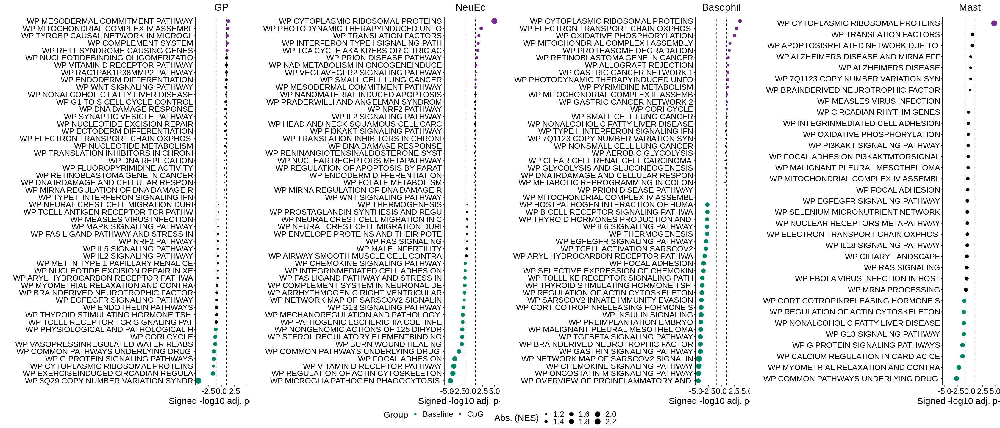


$`3`


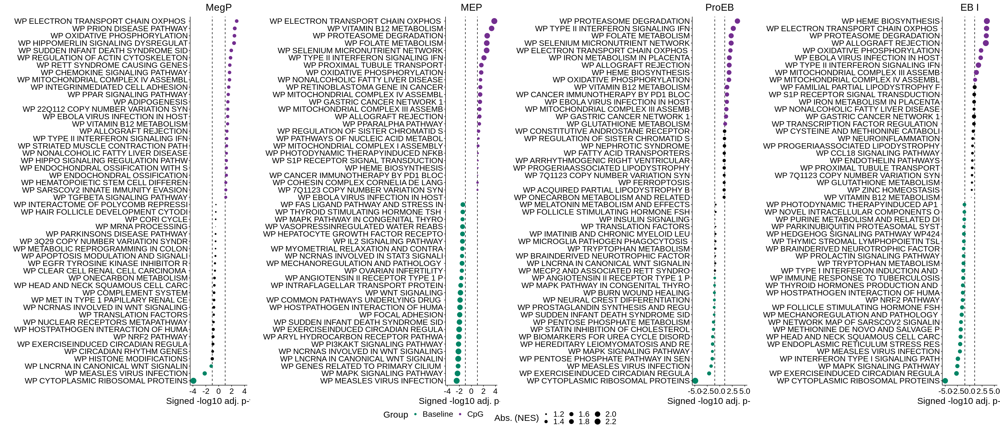


$`4`


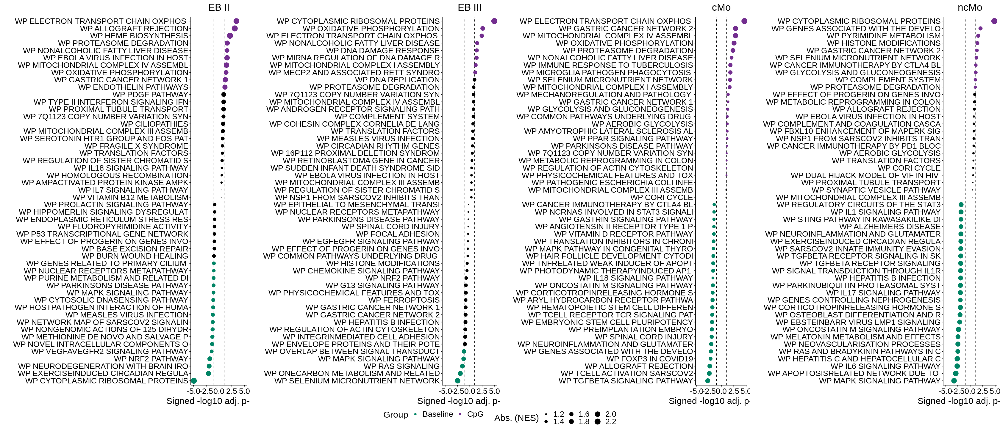


$`5`


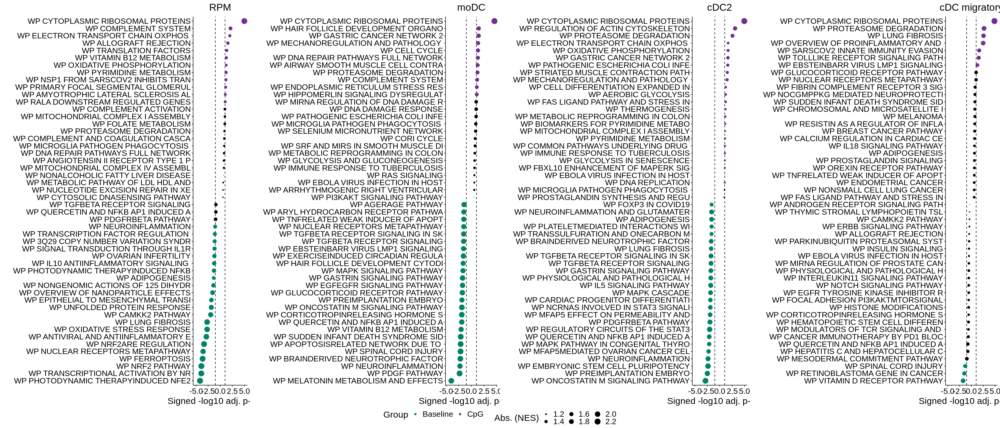


attr(,"class")
[1] "list"      "ggarrange"


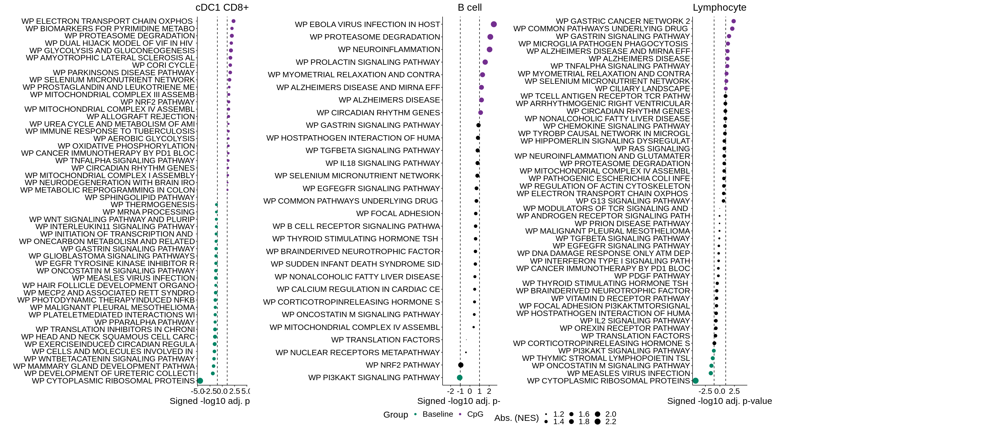

In [41]:
options(repr.plot.width=4*7, repr.plot.height=12)

gsea_pl_1 <- lapply(names(res_gsea_1), function(i) gsea_pl(res_gsea_1[[i]], pval_thr=0.1, title=i, size_range=5, pathway_suffix="HALLMARK", top=25))
                    
ggpubr::ggarrange(plotlist=gsea_pl_1, ncol=4, common.legend=TRUE, legend="bottom") %>% print()

## Gene set enrichment analysis (Hallmark)

In [29]:
gs_mm <- msigdbr(species="Mus musculus", category="C2", subcategory="WIKIPATHWAYS")
gs_mm <- split(x=gs_mm$gene_symbol, f=gs_mm$gs_name)

In [30]:
res_gsea_1 <- lapply(res_dea_1, function(res_dea) gsea(res_dea=res_dea, gene_set=gs_mm))

$`1`

$`2`


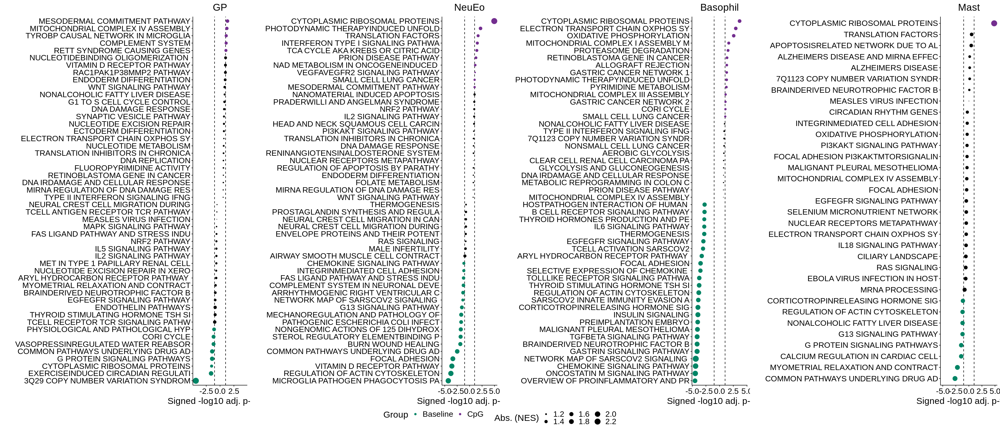


$`3`


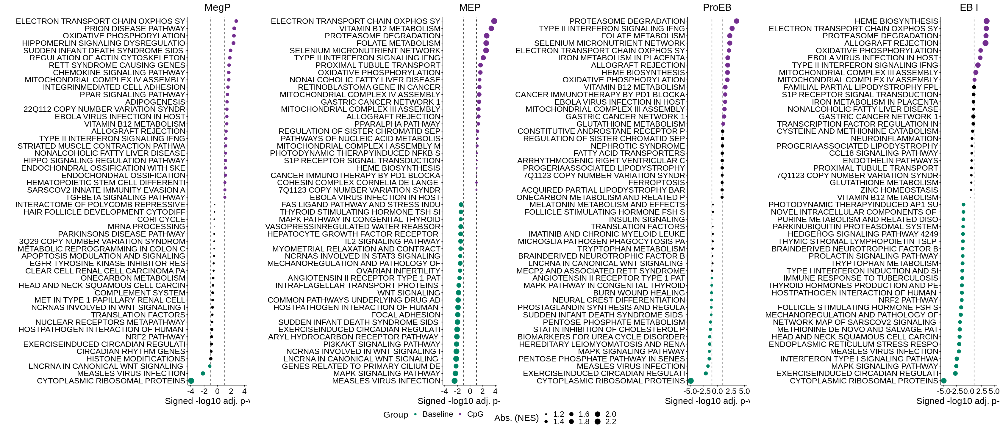


$`4`


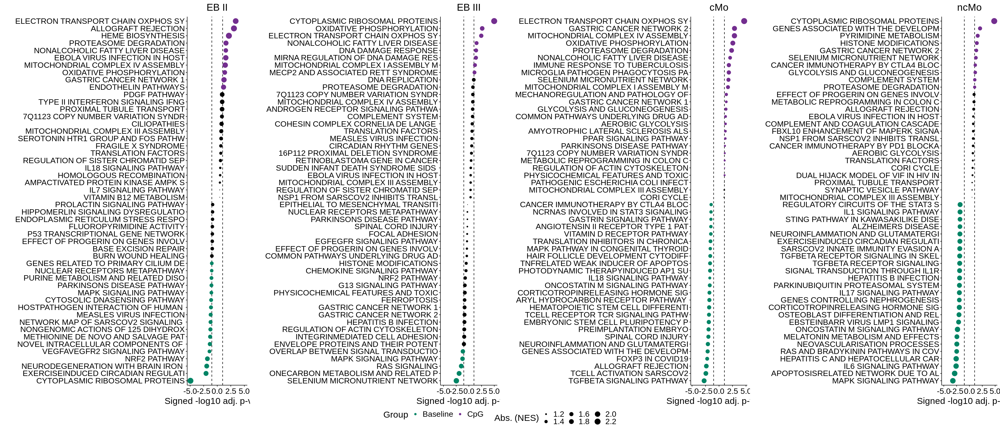


$`5`


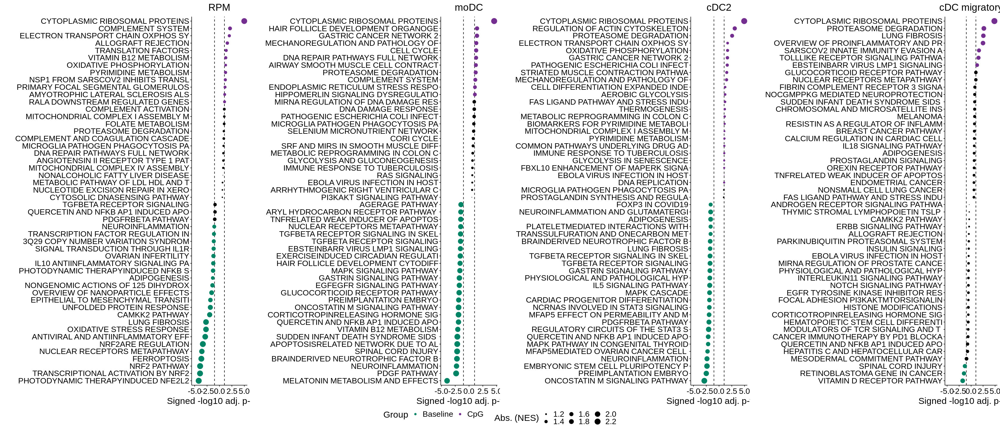


attr(,"class")
[1] "list"      "ggarrange"


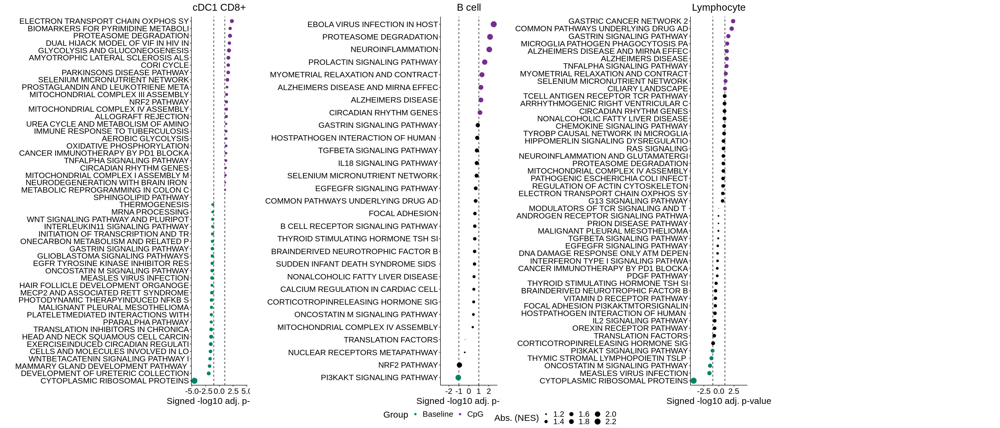

In [40]:
options(repr.plot.width=4*7, repr.plot.height=12)

gsea_pl_1 <- lapply(names(res_gsea_1), function(i) gsea_pl(res_gsea_1[[i]], pval_thr=0.1, title=i, size_range=5, pathway_suffix="WP", top=25))
                    
ggpubr::ggarrange(plotlist=gsea_pl_1, ncol=4, common.legend=TRUE, legend="bottom") %>% print()

# Session info 

In [ ]:
sessionInfo()